In [1]:
from models.networks import ResnetGenerator, NLayerDiscriminator, get_norm_layer, init_net
import torch
import torch.nn as nn
import torch.optim as optim

device = "mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu")

norm_layer = get_norm_layer("instance") # Jeder Channel von einem Bild wird separat normiert 
G_XY = ResnetGenerator(3, 3, ngf = 64, norm_layer= norm_layer, use_dropout=False, n_blocks=9)
G_YX = ResnetGenerator(3, 3, ngf = 64, norm_layer= norm_layer, use_dropout=False, n_blocks=9)

D_X = NLayerDiscriminator(3, ndf=64, n_layers=3, norm_layer=norm_layer) # für Pferde
D_Y = NLayerDiscriminator(3, ndf=64, n_layers=3, norm_layer=norm_layer)

# 
G_XY = init_net(G_XY, init_type="normal", init_gain=0.02).to(device)
G_YX = init_net(G_YX, init_type="normal", init_gain=0.02).to(device)
D_X = init_net(D_X, init_type="normal", init_gain=0.02).to(device)
D_Y = init_net(D_Y, init_type="normal", init_gain=0.02).to(device)



ModuleNotFoundError: No module named 'models'

In [ ]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize(256),
    #transforms.RandomCrop(256),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

from PIL import Image
from torch.utils.data import Dataset
import os

class SingleImageFolder(Dataset):
    """Loads all images in a folder without requiring class subfolders."""
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.files = sorted([
            os.path.join(root, f)
            for f in os.listdir(root)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ])
        if len(self.files) == 0:
            raise RuntimeError(f"No images found in {root}")

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img


dataset_X = SingleImageFolder("datasets/horse2zebra/trainA", transform=transform)  # horses
dataset_Y = SingleImageFolder("datasets/horse2zebra/trainB", transform=transform)  # zebras

loader_X = DataLoader(dataset_X, batch_size=1, shuffle=True) # typisch für CycleGAN
loader_Y = DataLoader(dataset_Y, batch_size=1, shuffle=True)


def inf_loader(dl):
    while True:
        for batch in dl:
            yield batch

iter_Y = inf_loader(loader_Y)


In [ ]:
mse = nn.MSELoss().to(device)
cycle_loss = nn.L1Loss().to(device)
identity_loss = nn.L1Loss().to(device)

lambda_cyc = 10.0
lambda_id = 0.5

opt_G = optim.Adam( 
    list(G_XY.parameters()) + list(G_YX.parameters()),
    lr = 1e-4
)

opt_D = optim.Adam(
    list(D_X.parameters()) + list(D_Y.parameters()),
    lr = 1e-4
)



In [ ]:
import matplotlib.pyplot as plt

def denorm(t):
    return (t + 1) / 2

def show_images(images, titles=None):
    n = len(images)
    plt.figure(figsize=(4*n, 4))

    for i, img in enumerate(images):
        if img.dim() == 4:  
            img = img[0]
        img = denorm(img.detach().cpu()).permute(1, 2, 0).numpy()  # HWC

        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.axis("off")
        if titles:
            plt.title(titles[i])
    plt.show()

/Users/grigo/gits/seminars/it-schulungen.com/PyTorch_RNN_GAN_Transformer/src_live/.venv/lib/python3.12/site-packages/torch/nn/modules/loss.py:634: UserWarning: Using a target size (torch.Size([1, 6, 6])) that is different to the input size (torch.Size([1, 1, 6, 6])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[Epoch 1/50 | Iter 0] G: 14.233  D: 3.374


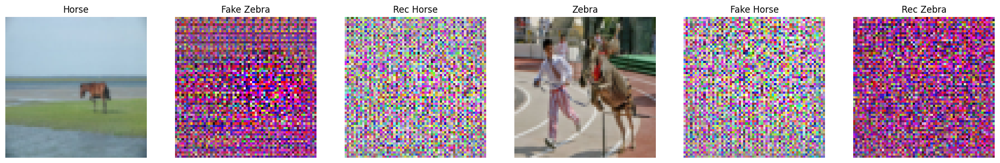

[Epoch 1/50 | Iter 500] G: 7.554  D: 0.544


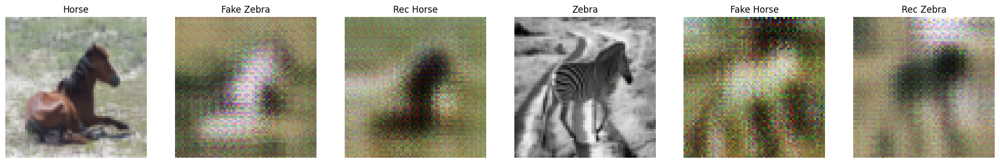

[Epoch 1/50 | Iter 1000] G: 4.731  D: 0.480


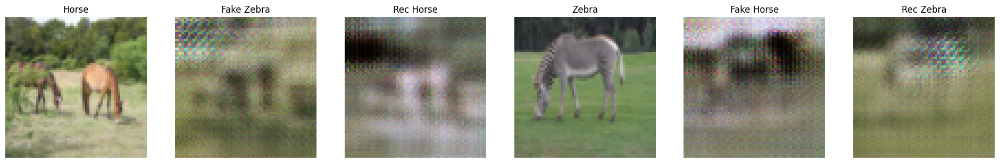

[Epoch 2/50 | Iter 0] G: 6.160  D: 0.621


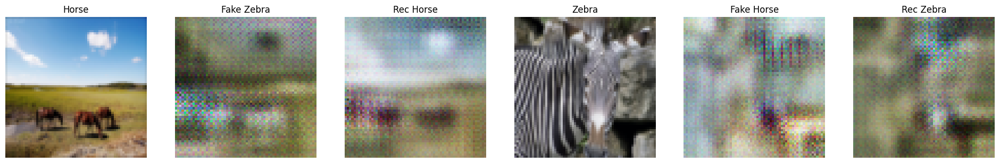

[Epoch 2/50 | Iter 500] G: 5.532  D: 0.317


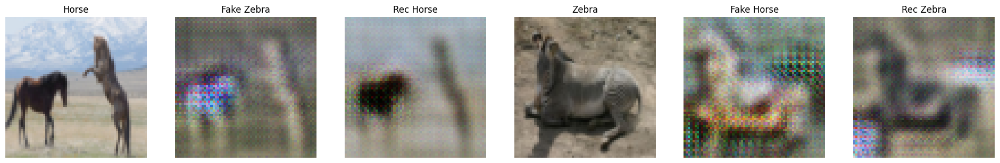

[Epoch 2/50 | Iter 1000] G: 6.439  D: 0.632


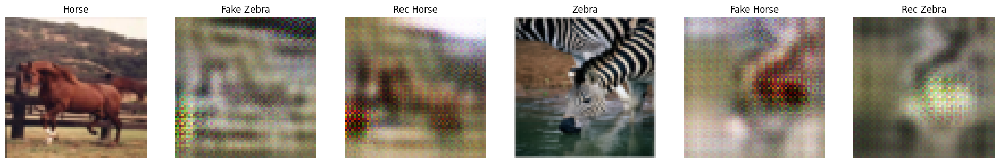

[Epoch 3/50 | Iter 0] G: 8.154  D: 0.480


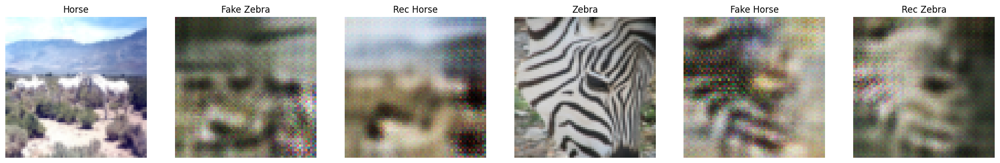

[Epoch 3/50 | Iter 500] G: 5.794  D: 0.713


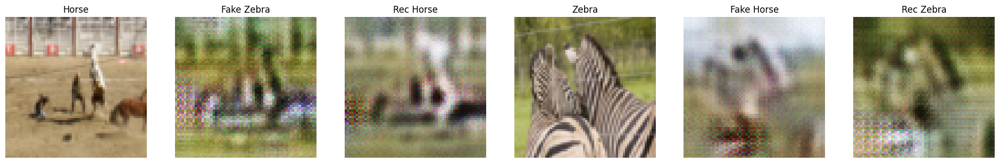

[Epoch 3/50 | Iter 1000] G: 4.911  D: 0.522


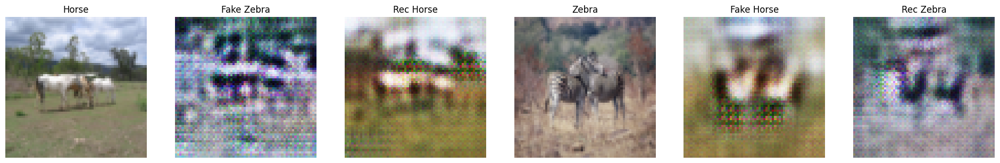

[Epoch 4/50 | Iter 0] G: 6.533  D: 0.609


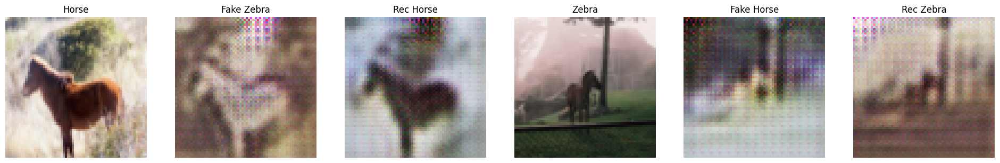

[Epoch 4/50 | Iter 500] G: 6.259  D: 0.548


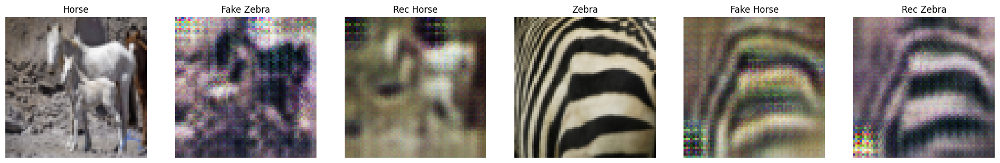

[Epoch 4/50 | Iter 1000] G: 5.486  D: 0.538


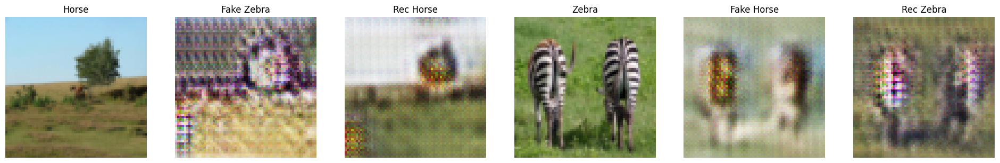

[Epoch 5/50 | Iter 0] G: 6.938  D: 0.253


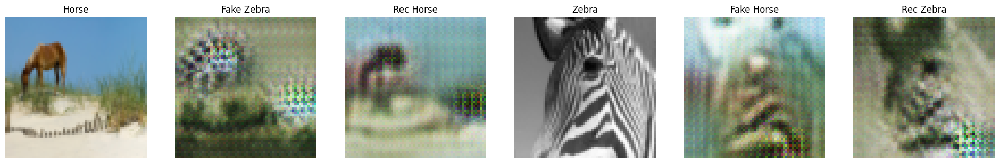

[Epoch 5/50 | Iter 500] G: 4.965  D: 0.284


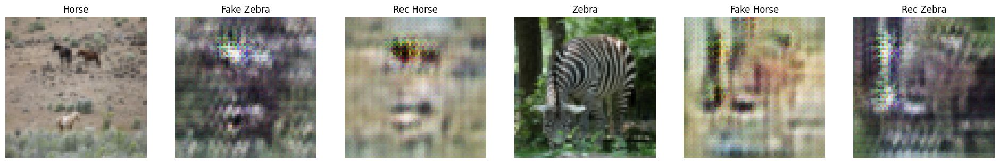

[Epoch 5/50 | Iter 1000] G: 5.172  D: 0.425


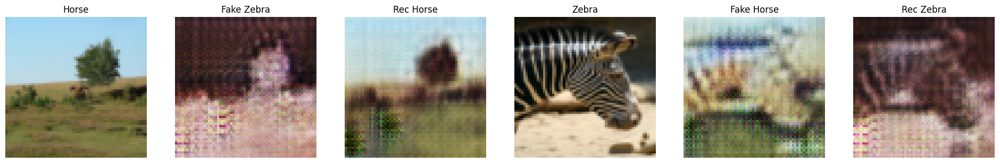

[Epoch 6/50 | Iter 0] G: 6.939  D: 0.315


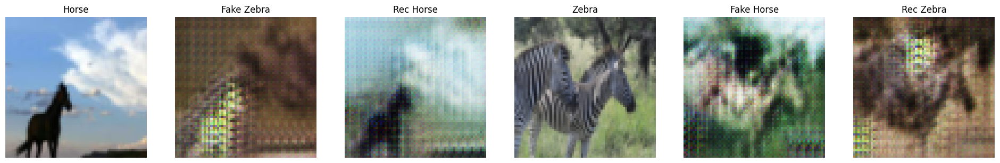

[Epoch 6/50 | Iter 500] G: 5.330  D: 0.382


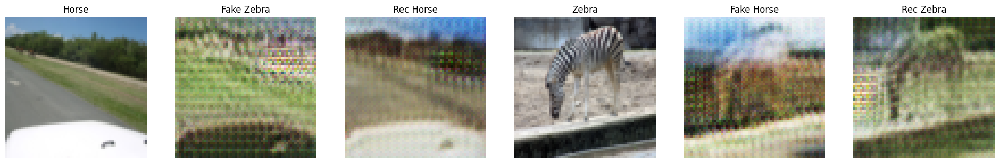

[Epoch 6/50 | Iter 1000] G: 6.730  D: 0.619


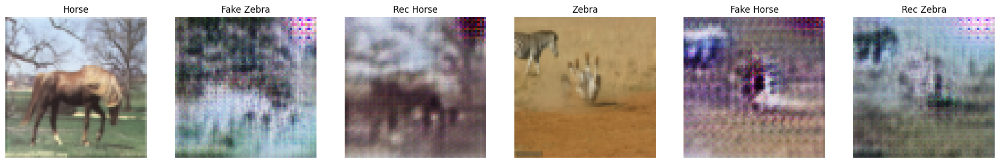

[Epoch 7/50 | Iter 0] G: 4.992  D: 0.362


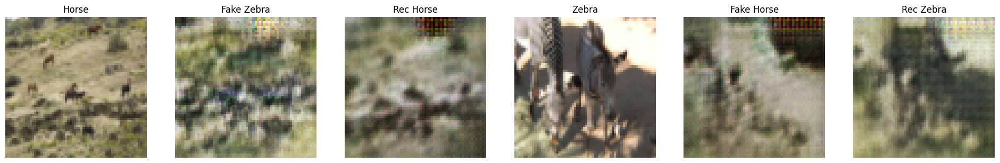

[Epoch 7/50 | Iter 500] G: 6.275  D: 0.710


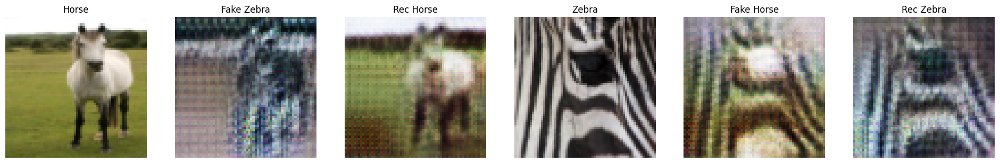

[Epoch 7/50 | Iter 1000] G: 6.882  D: 0.179


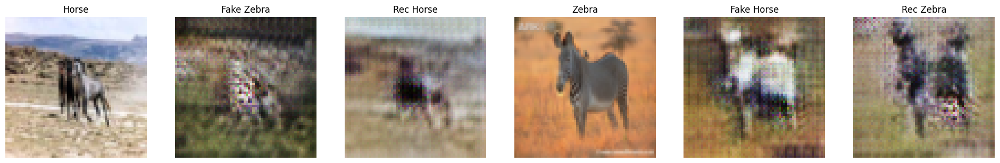

[Epoch 8/50 | Iter 0] G: 5.529  D: 0.785


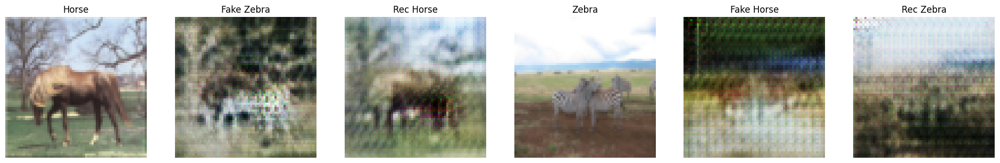

[Epoch 8/50 | Iter 500] G: 8.671  D: 0.301


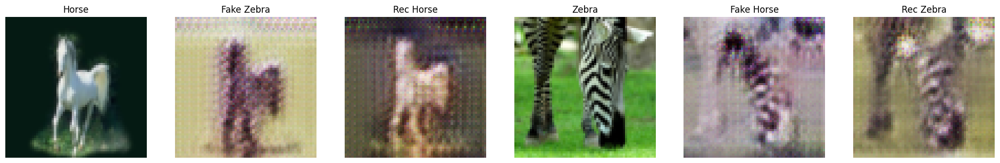

[Epoch 8/50 | Iter 1000] G: 5.610  D: 1.030


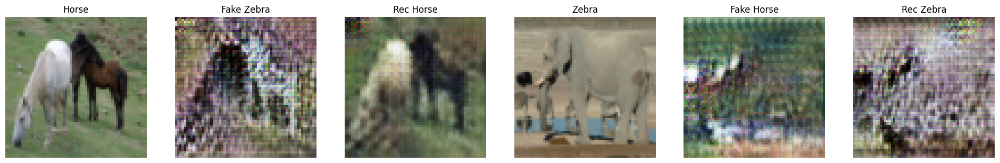

[Epoch 9/50 | Iter 0] G: 5.628  D: 0.331


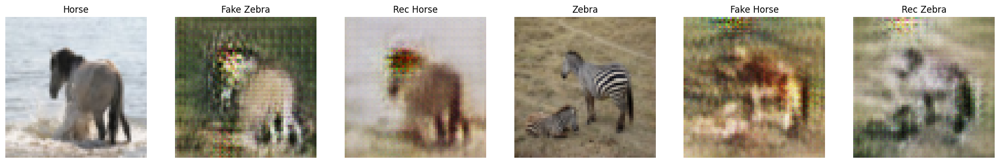

[Epoch 9/50 | Iter 500] G: 5.110  D: 0.482


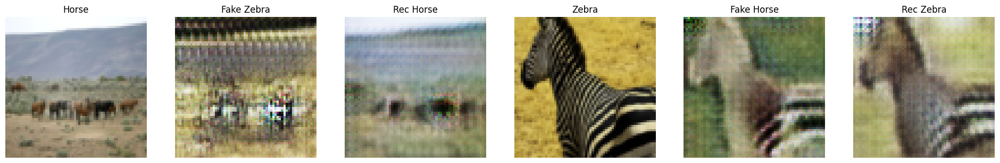

[Epoch 9/50 | Iter 1000] G: 7.109  D: 0.220


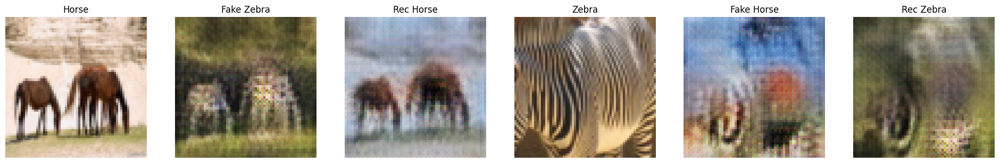

[Epoch 10/50 | Iter 0] G: 7.060  D: 0.127


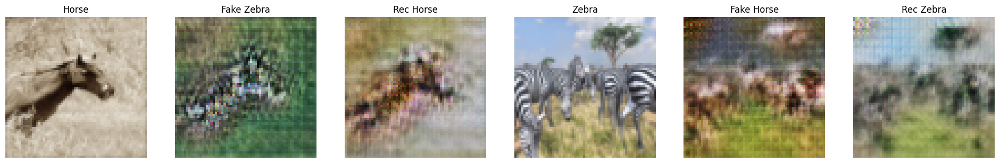

[Epoch 10/50 | Iter 500] G: 5.921  D: 0.340


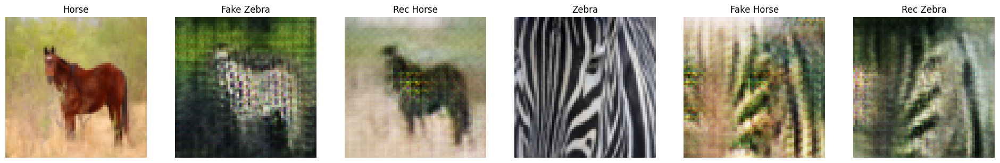

[Epoch 10/50 | Iter 1000] G: 6.920  D: 0.356


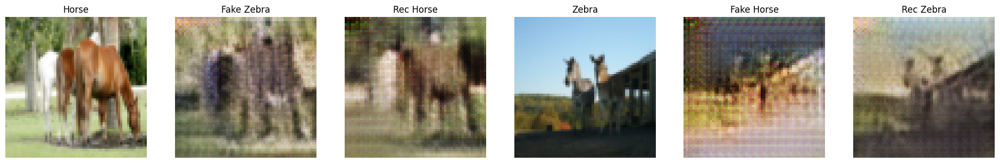

[Epoch 11/50 | Iter 0] G: 5.747  D: 0.775


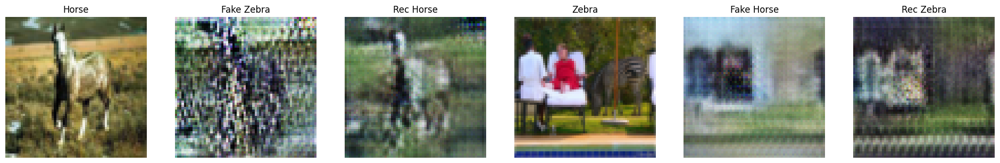

[Epoch 11/50 | Iter 500] G: 5.234  D: 0.580


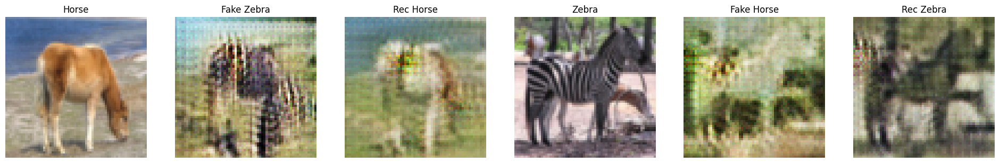

[Epoch 11/50 | Iter 1000] G: 5.468  D: 0.404


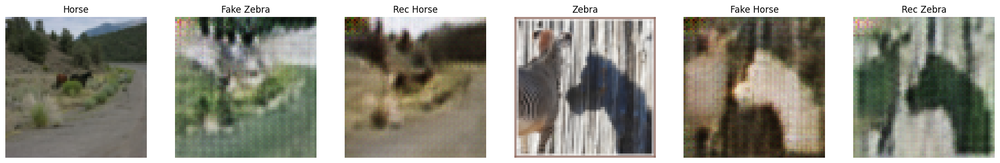

[Epoch 12/50 | Iter 0] G: 5.745  D: 0.322


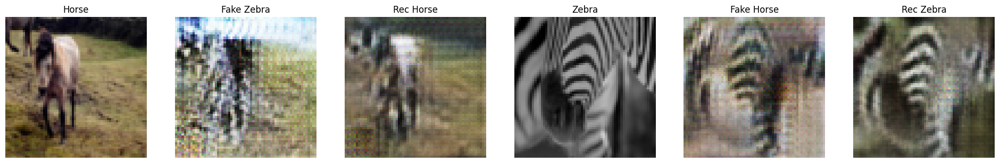

[Epoch 12/50 | Iter 500] G: 8.116  D: 0.316


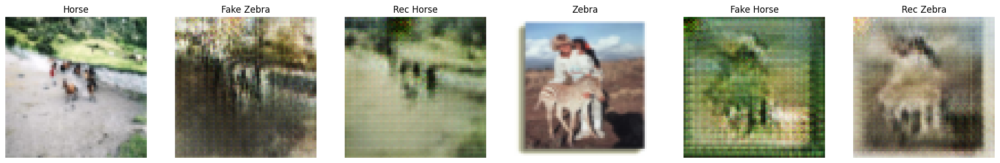

[Epoch 12/50 | Iter 1000] G: 5.913  D: 0.466


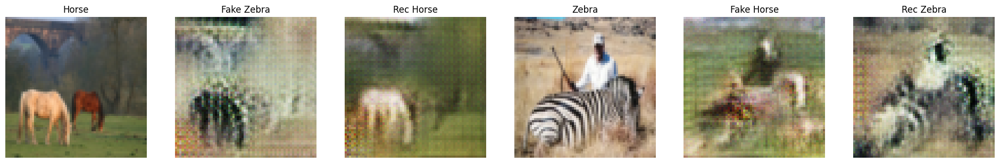

[Epoch 13/50 | Iter 0] G: 6.416  D: 0.330


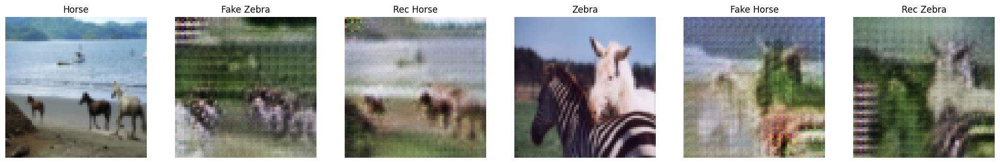

[Epoch 13/50 | Iter 500] G: 6.162  D: 0.198


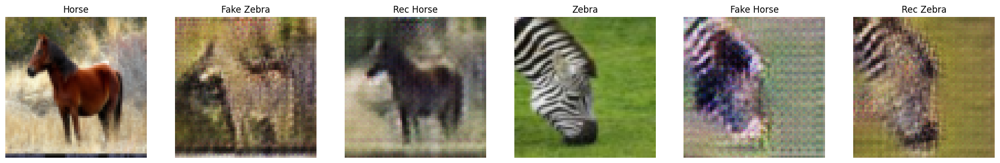

[Epoch 13/50 | Iter 1000] G: 4.460  D: 0.298


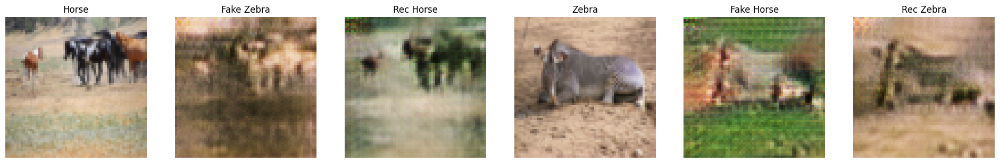

[Epoch 14/50 | Iter 0] G: 5.672  D: 0.755


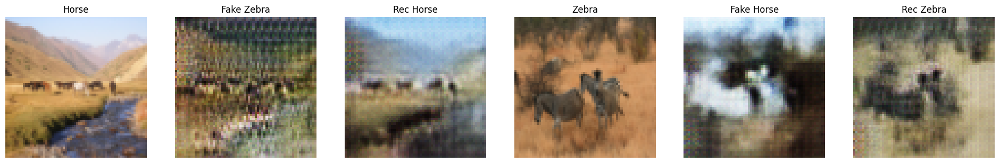

[Epoch 14/50 | Iter 500] G: 5.146  D: 0.354


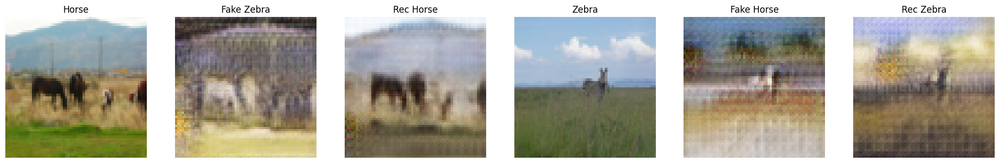

[Epoch 14/50 | Iter 1000] G: 5.774  D: 0.584


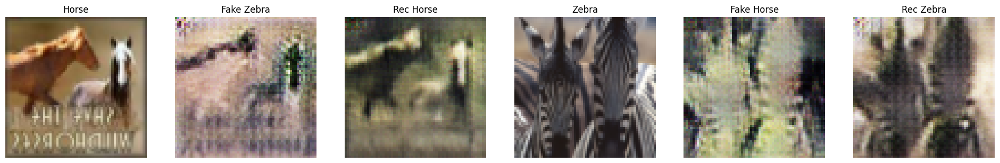

[Epoch 15/50 | Iter 0] G: 6.751  D: 0.668


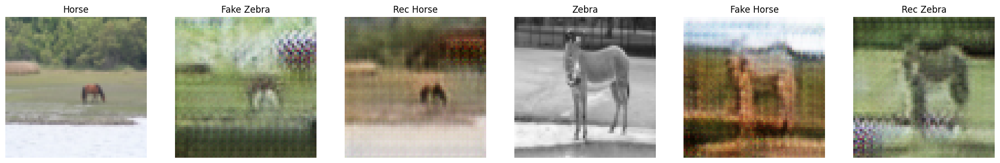

[Epoch 15/50 | Iter 500] G: 5.785  D: 0.180


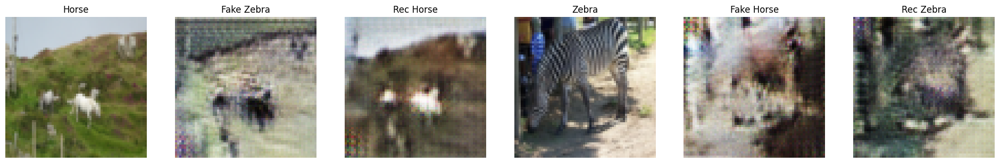

[Epoch 15/50 | Iter 1000] G: 5.756  D: 0.585


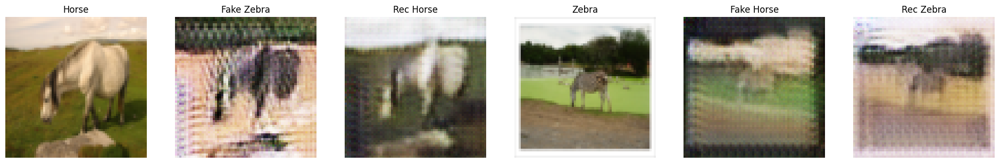

[Epoch 16/50 | Iter 0] G: 4.644  D: 0.444


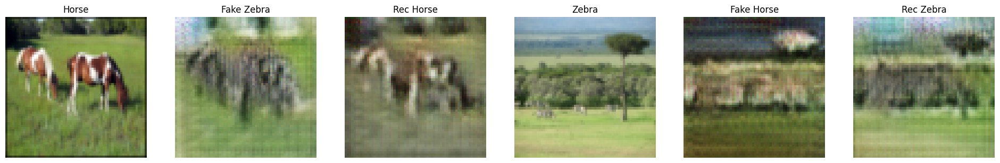

[Epoch 16/50 | Iter 500] G: 4.907  D: 0.172


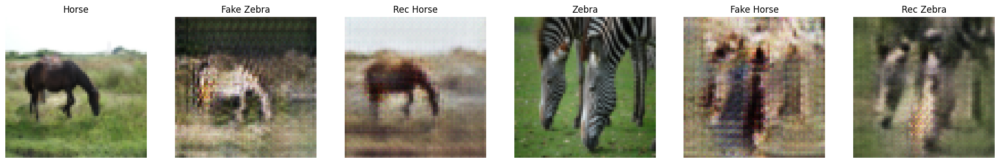

[Epoch 16/50 | Iter 1000] G: 5.983  D: 0.411


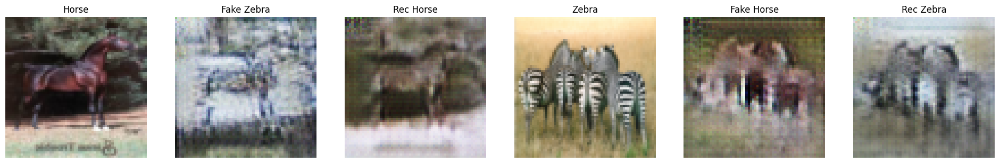

[Epoch 17/50 | Iter 0] G: 6.408  D: 0.335


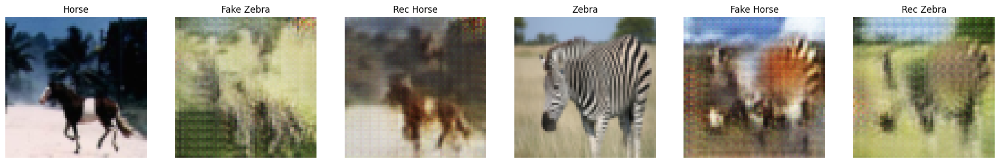

[Epoch 17/50 | Iter 500] G: 6.135  D: 0.776


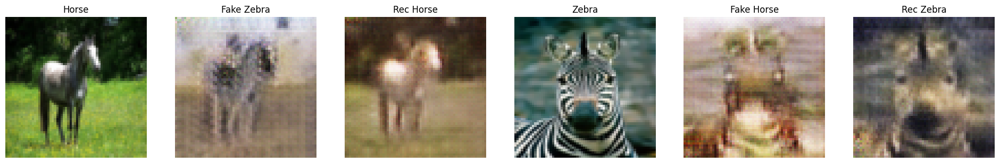

[Epoch 17/50 | Iter 1000] G: 5.768  D: 0.127


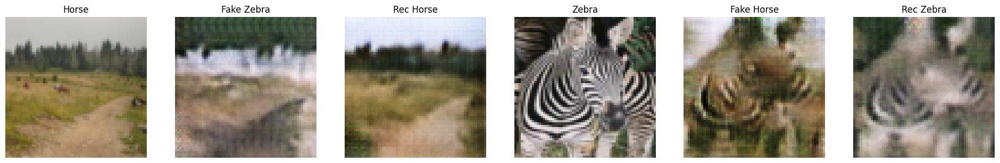

[Epoch 18/50 | Iter 0] G: 6.480  D: 0.135


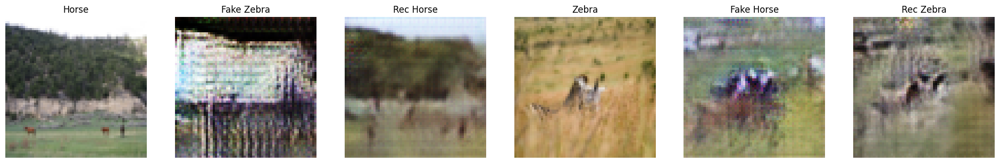

[Epoch 18/50 | Iter 500] G: 6.051  D: 0.452


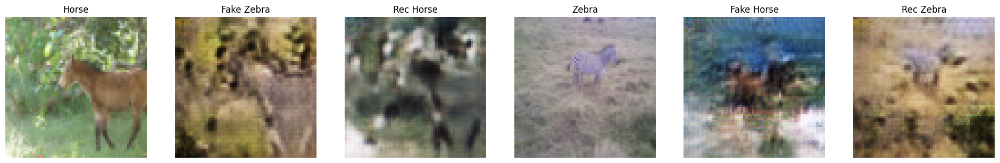

[Epoch 18/50 | Iter 1000] G: 4.046  D: 0.210


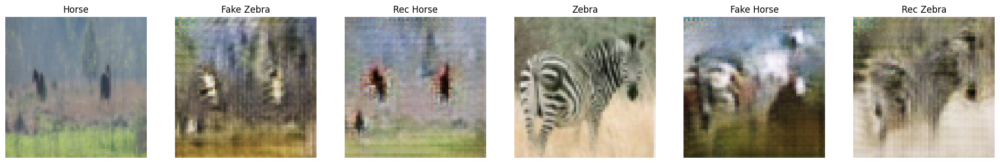

[Epoch 19/50 | Iter 0] G: 5.225  D: 0.280


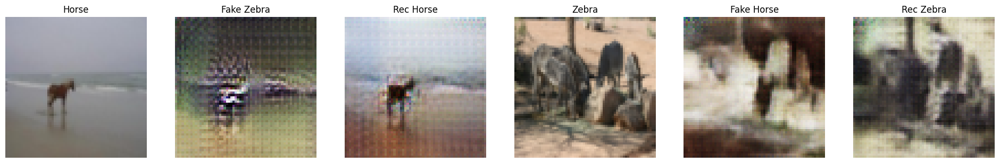

[Epoch 19/50 | Iter 500] G: 6.560  D: 0.193


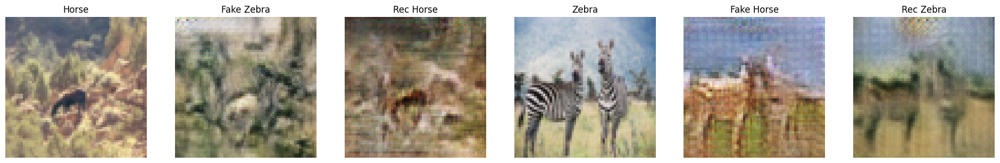

[Epoch 19/50 | Iter 1000] G: 4.007  D: 0.305


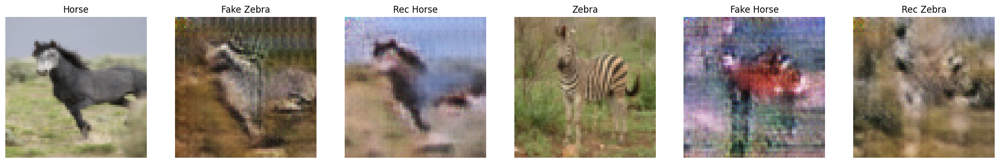

[Epoch 20/50 | Iter 0] G: 5.003  D: 0.374


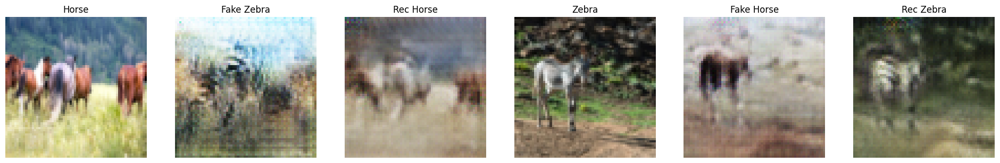

[Epoch 20/50 | Iter 500] G: 7.694  D: 0.164


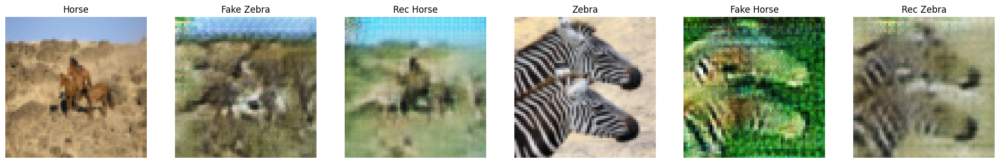

[Epoch 20/50 | Iter 1000] G: 5.150  D: 0.288


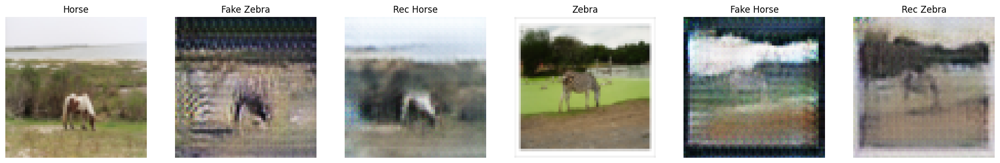

[Epoch 21/50 | Iter 0] G: 6.765  D: 0.196


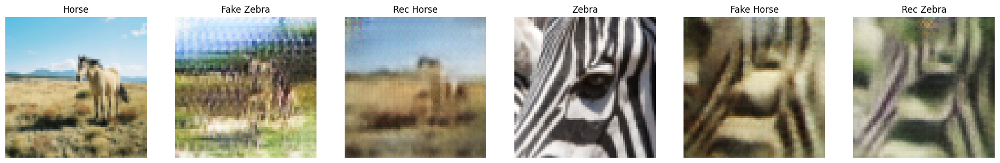

[Epoch 21/50 | Iter 500] G: 6.953  D: 0.692


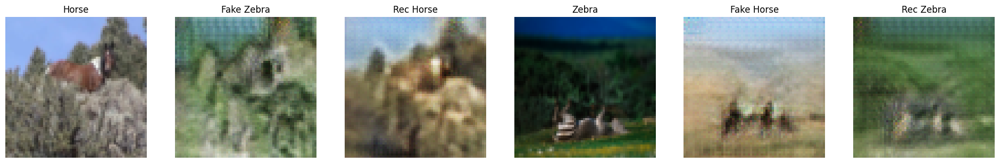

[Epoch 21/50 | Iter 1000] G: 5.001  D: 0.175


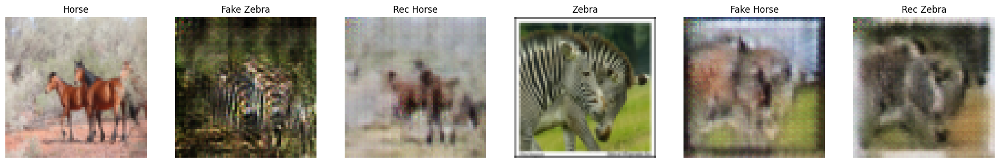

[Epoch 22/50 | Iter 0] G: 5.690  D: 0.369


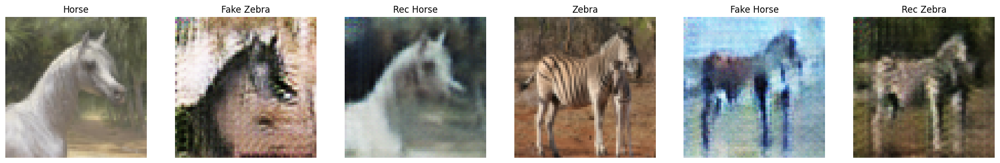

[Epoch 22/50 | Iter 500] G: 5.049  D: 0.437


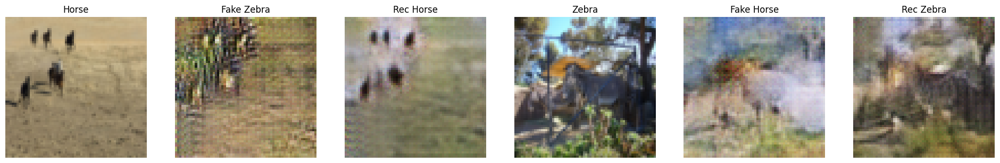

[Epoch 22/50 | Iter 1000] G: 5.061  D: 0.287


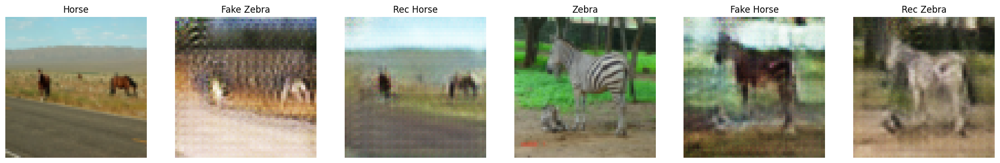

[Epoch 23/50 | Iter 0] G: 4.506  D: 0.319


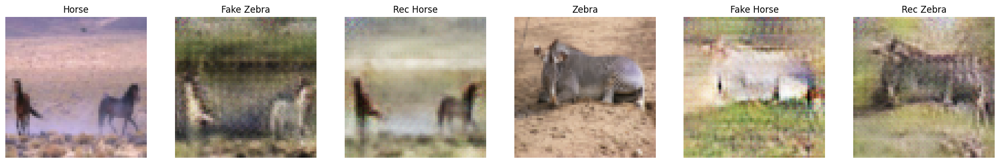

[Epoch 23/50 | Iter 500] G: 6.120  D: 0.138


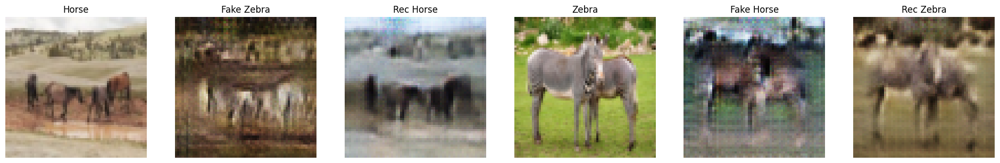

[Epoch 23/50 | Iter 1000] G: 5.177  D: 0.347


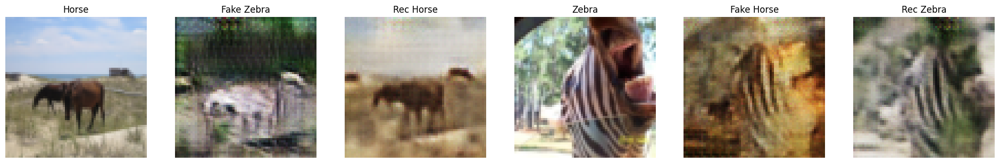

[Epoch 24/50 | Iter 0] G: 4.528  D: 0.261


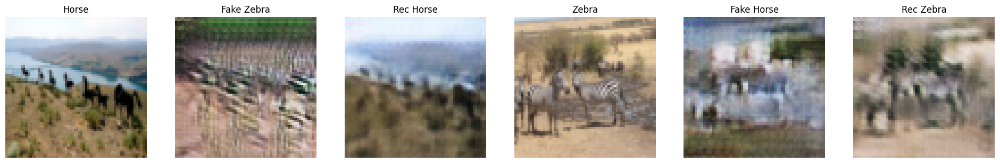

[Epoch 24/50 | Iter 500] G: 4.616  D: 0.446


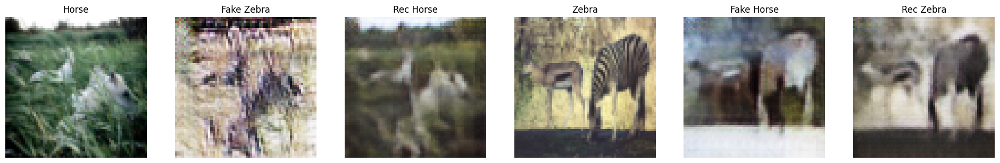

[Epoch 24/50 | Iter 1000] G: 4.991  D: 0.462


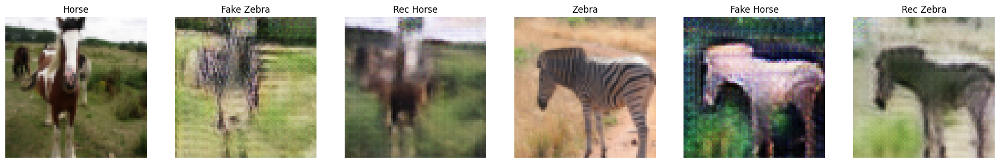

[Epoch 25/50 | Iter 0] G: 4.746  D: 0.291


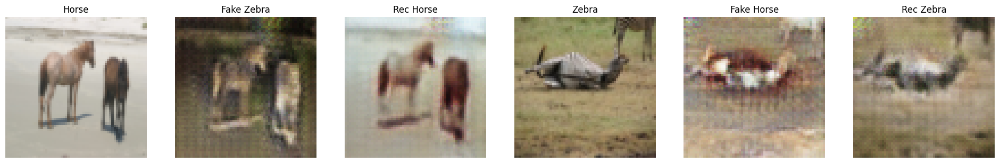

[Epoch 25/50 | Iter 500] G: 5.003  D: 0.378


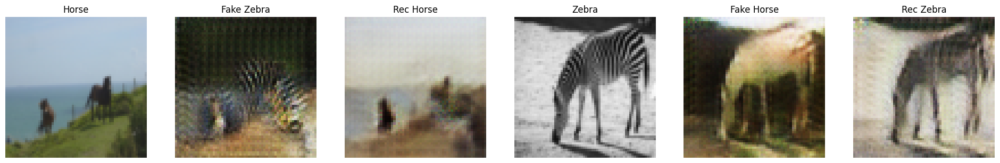

[Epoch 25/50 | Iter 1000] G: 4.707  D: 0.651


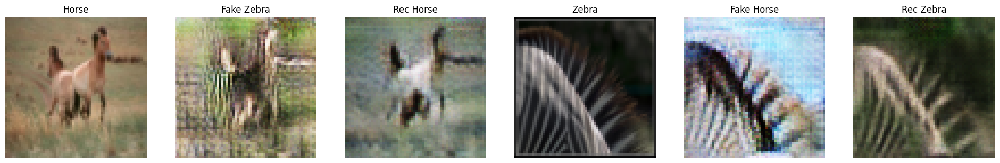

[Epoch 26/50 | Iter 0] G: 4.475  D: 0.655


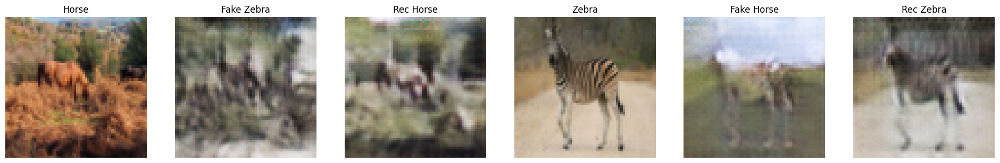

[Epoch 26/50 | Iter 500] G: 5.786  D: 0.405


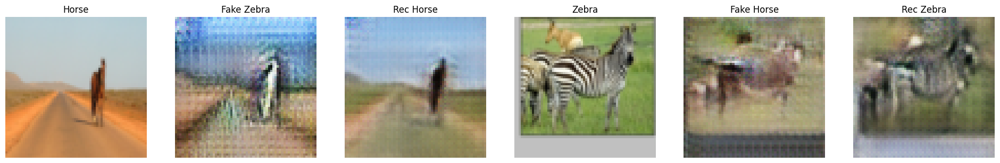

[Epoch 26/50 | Iter 1000] G: 4.341  D: 0.424


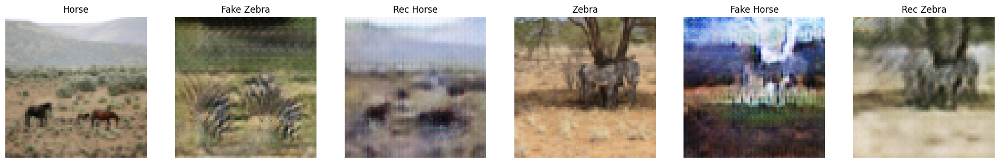

[Epoch 27/50 | Iter 0] G: 6.272  D: 0.095


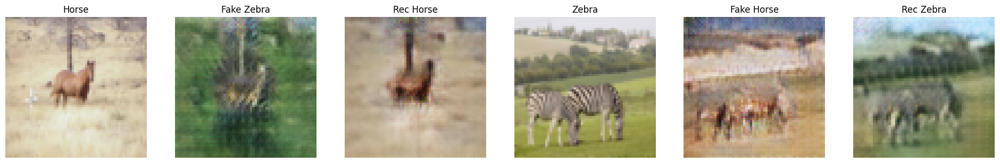

[Epoch 27/50 | Iter 500] G: 5.671  D: 0.319


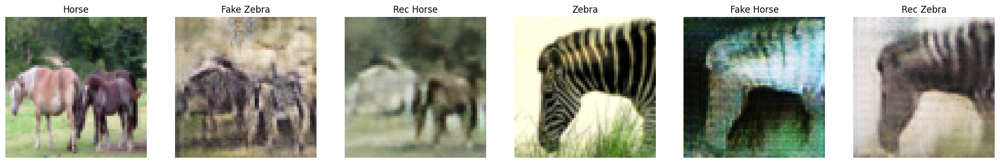

[Epoch 27/50 | Iter 1000] G: 6.222  D: 0.204


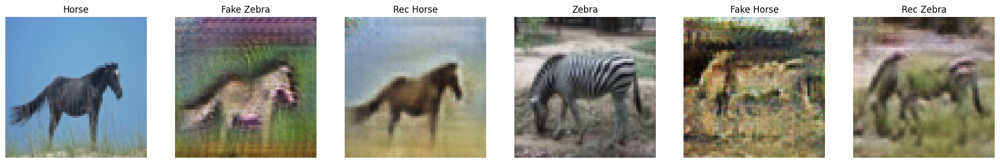

[Epoch 28/50 | Iter 0] G: 6.139  D: 0.399


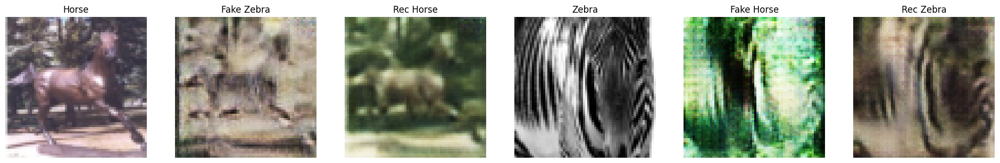

[Epoch 28/50 | Iter 500] G: 7.028  D: 0.168


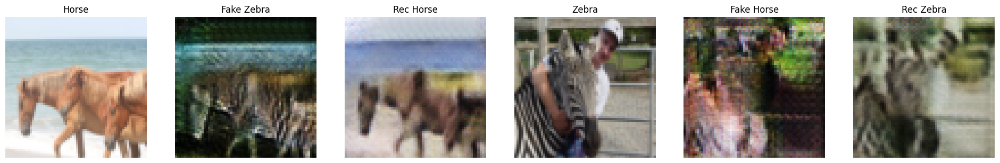

[Epoch 28/50 | Iter 1000] G: 5.340  D: 0.357


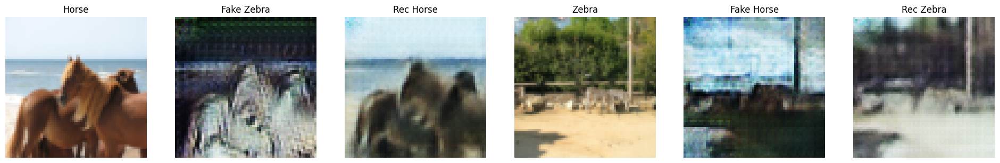

[Epoch 29/50 | Iter 0] G: 6.553  D: 0.233


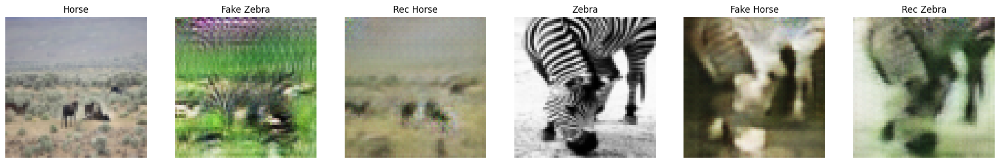

[Epoch 29/50 | Iter 500] G: 7.178  D: 0.210


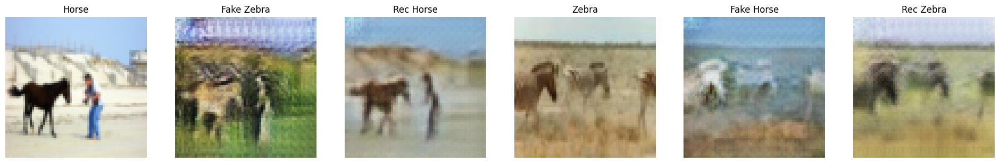

[Epoch 29/50 | Iter 1000] G: 3.850  D: 0.326


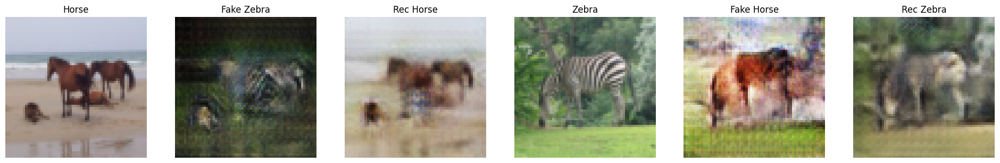

[Epoch 30/50 | Iter 0] G: 6.330  D: 0.485


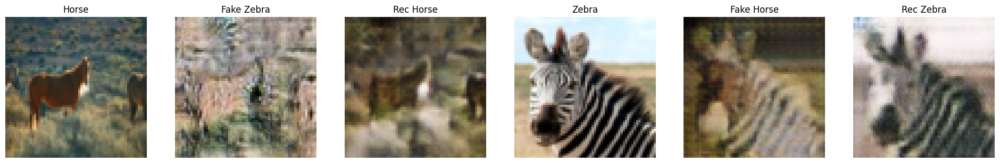

[Epoch 30/50 | Iter 500] G: 6.409  D: 0.378


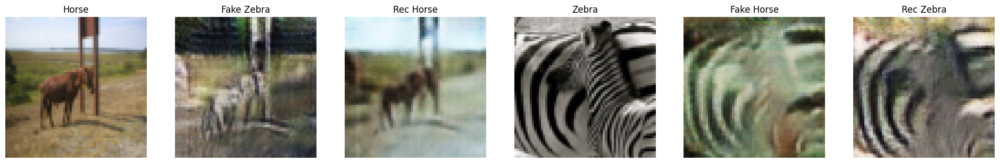

[Epoch 30/50 | Iter 1000] G: 5.357  D: 0.178


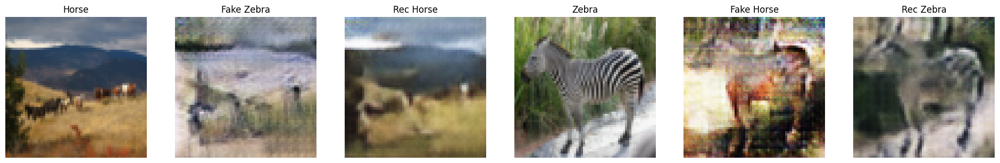

[Epoch 31/50 | Iter 0] G: 7.190  D: 0.172


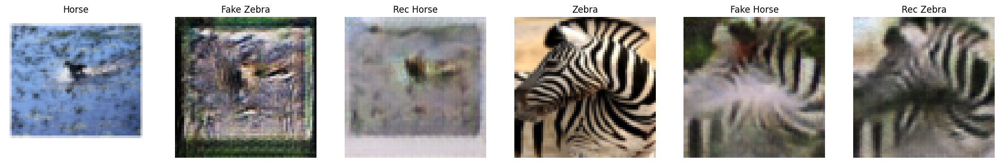

[Epoch 31/50 | Iter 500] G: 5.380  D: 0.159


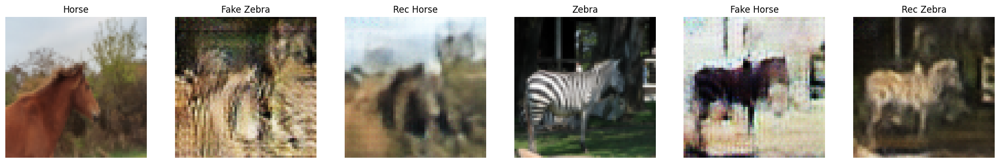

[Epoch 31/50 | Iter 1000] G: 4.569  D: 0.277


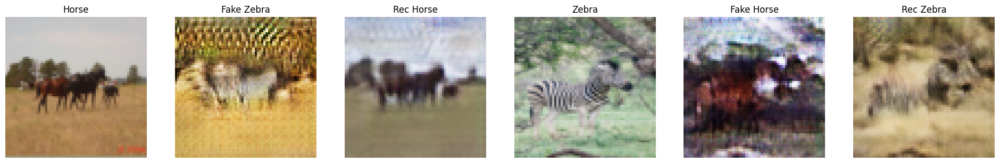

[Epoch 32/50 | Iter 0] G: 4.267  D: 0.421


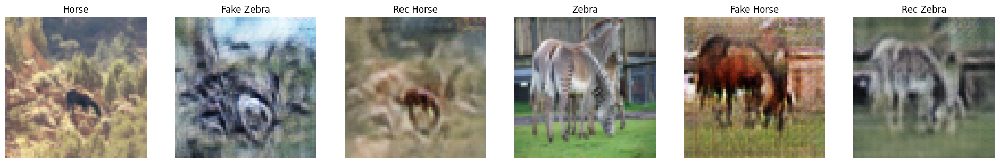

[Epoch 32/50 | Iter 500] G: 4.890  D: 0.386


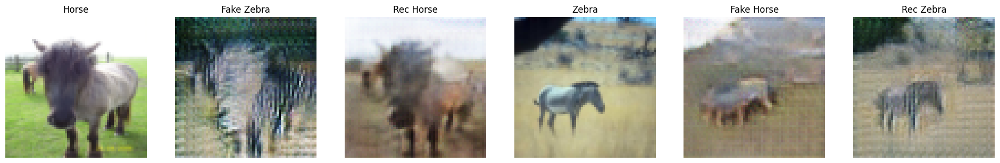

[Epoch 32/50 | Iter 1000] G: 5.801  D: 0.367


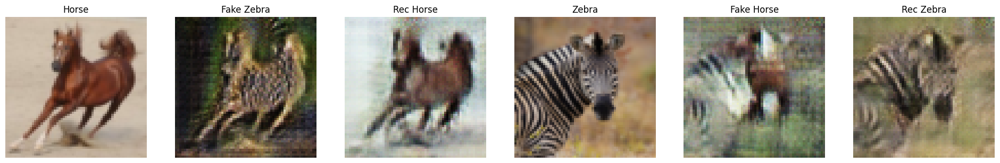

[Epoch 33/50 | Iter 0] G: 4.718  D: 0.322


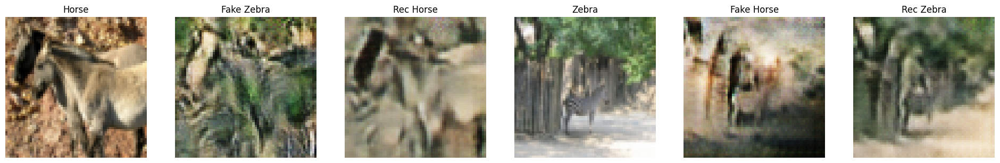

[Epoch 33/50 | Iter 500] G: 7.061  D: 0.139


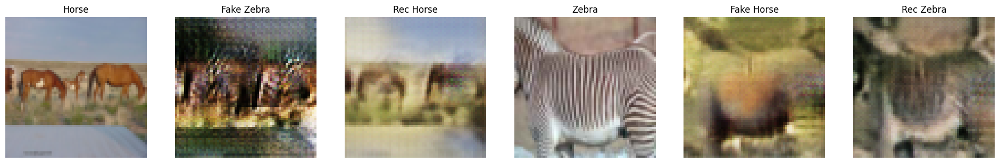

[Epoch 33/50 | Iter 1000] G: 5.688  D: 0.132


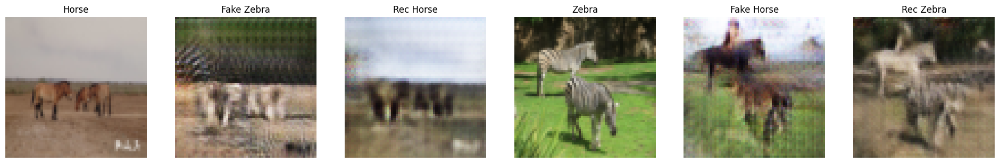

[Epoch 34/50 | Iter 0] G: 5.884  D: 0.323


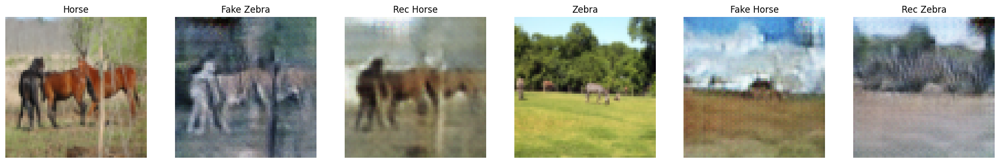

[Epoch 34/50 | Iter 500] G: 4.624  D: 0.430


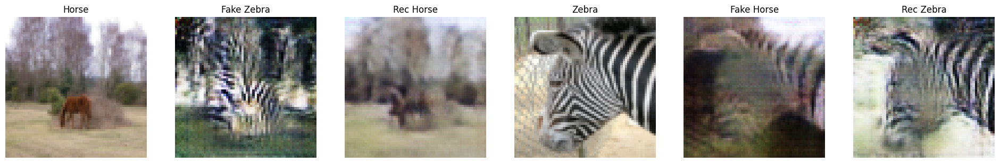

[Epoch 34/50 | Iter 1000] G: 4.001  D: 0.657


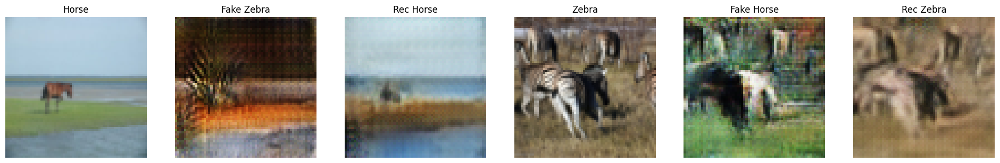

[Epoch 35/50 | Iter 0] G: 6.678  D: 0.324


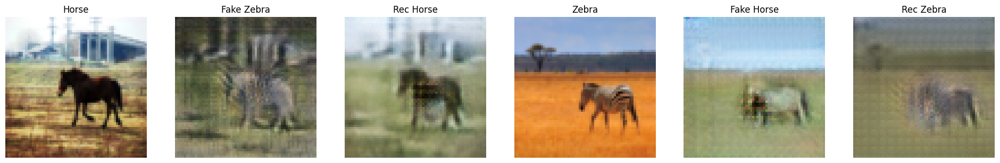

[Epoch 35/50 | Iter 500] G: 4.916  D: 0.292


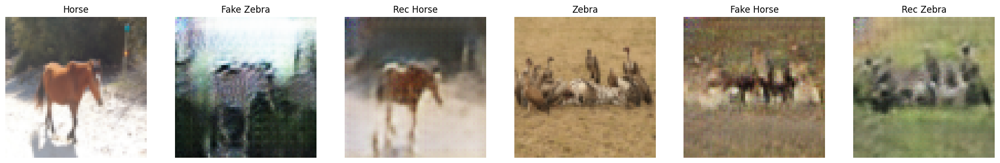

[Epoch 35/50 | Iter 1000] G: 6.015  D: 0.293


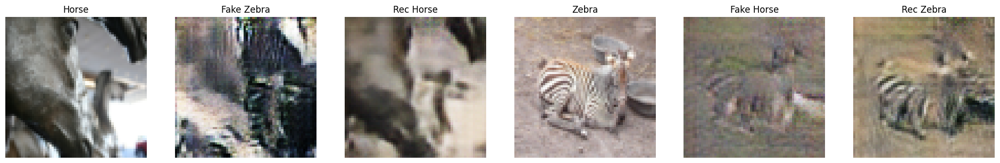

[Epoch 36/50 | Iter 0] G: 4.227  D: 0.165


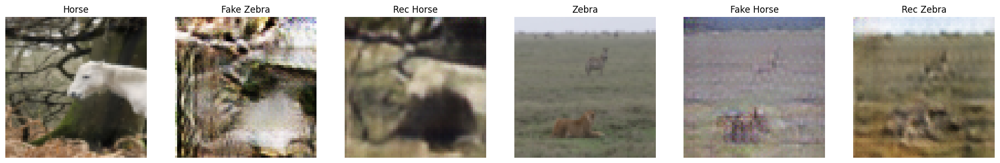

[Epoch 36/50 | Iter 500] G: 6.126  D: 0.285


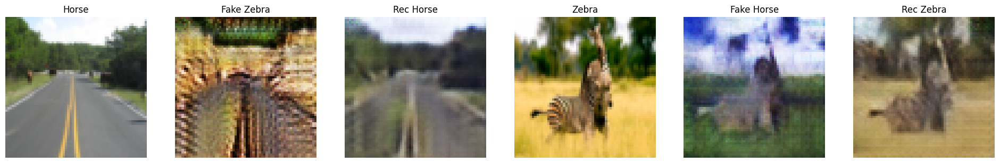

[Epoch 36/50 | Iter 1000] G: 5.058  D: 0.239


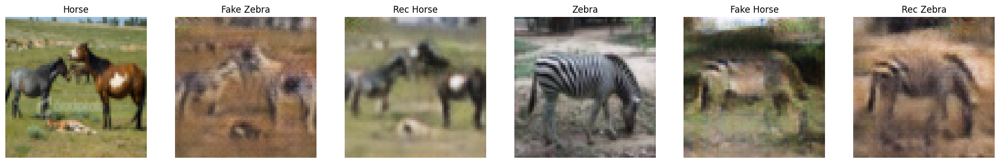

[Epoch 37/50 | Iter 0] G: 4.212  D: 0.330


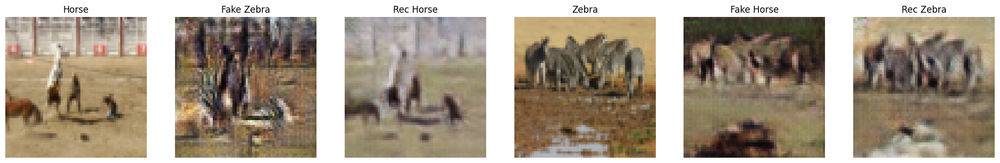

[Epoch 37/50 | Iter 500] G: 4.070  D: 0.353


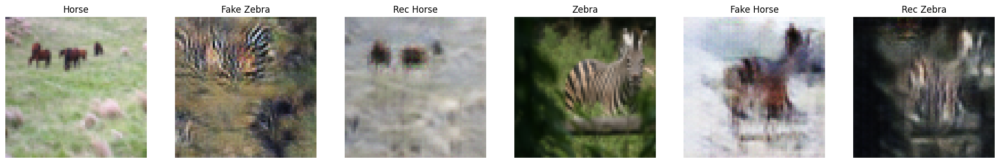

[Epoch 37/50 | Iter 1000] G: 6.207  D: 0.323


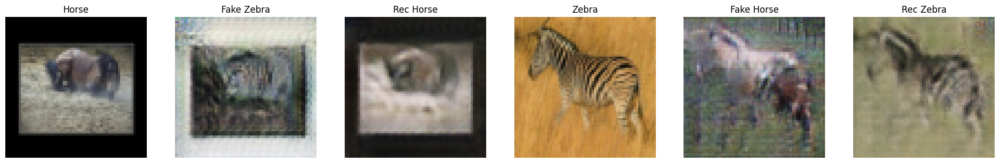

[Epoch 38/50 | Iter 0] G: 5.929  D: 0.233


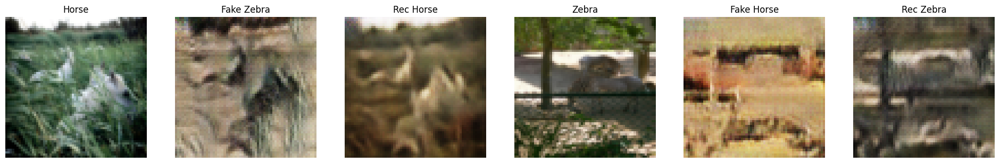

[Epoch 38/50 | Iter 500] G: 5.082  D: 0.143


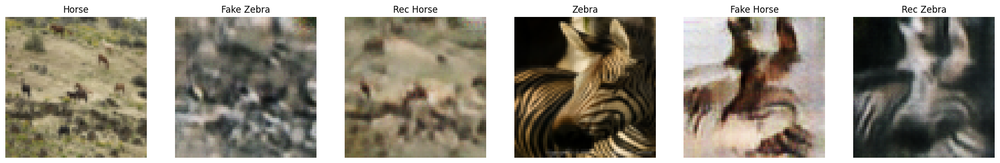

[Epoch 38/50 | Iter 1000] G: 5.098  D: 0.314


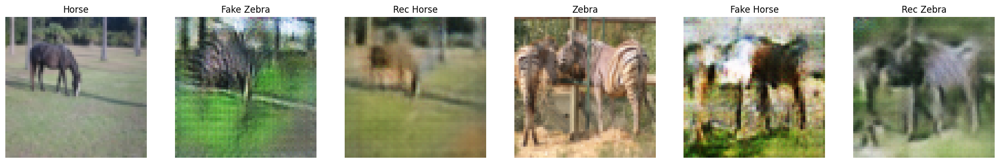

[Epoch 39/50 | Iter 0] G: 4.282  D: 0.377


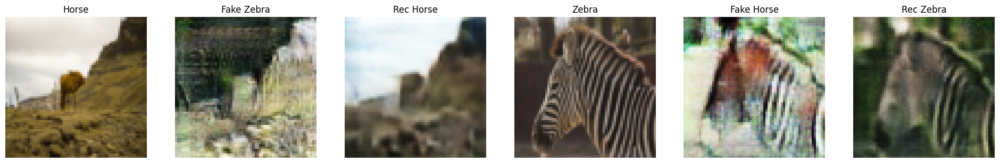

[Epoch 39/50 | Iter 500] G: 4.440  D: 0.436


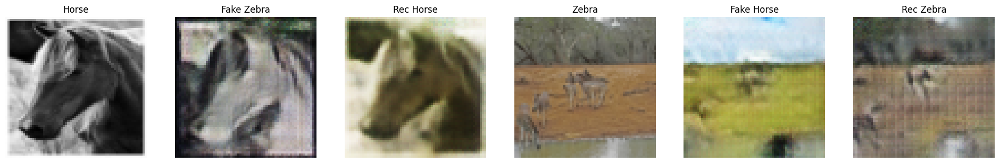

[Epoch 39/50 | Iter 1000] G: 8.165  D: 0.325


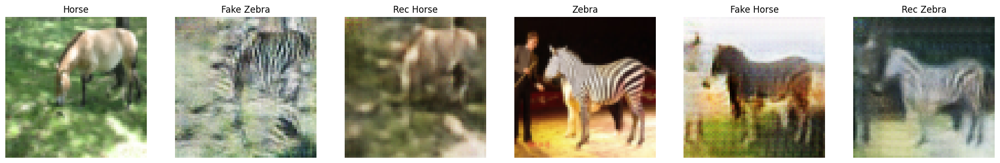

[Epoch 40/50 | Iter 0] G: 4.255  D: 0.128


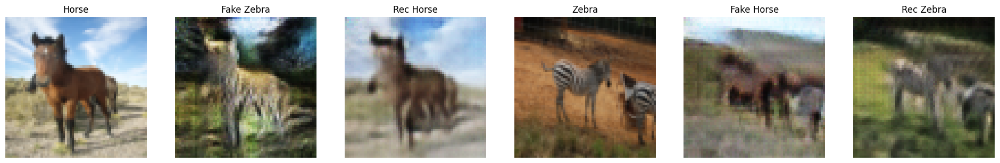

[Epoch 40/50 | Iter 500] G: 3.635  D: 0.424


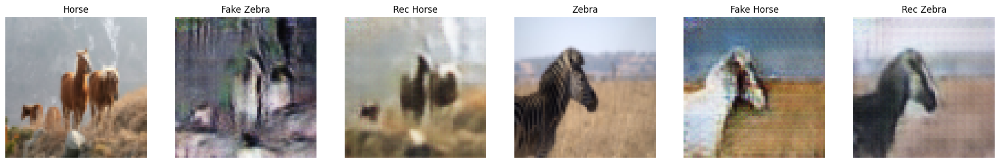

[Epoch 40/50 | Iter 1000] G: 5.035  D: 0.278


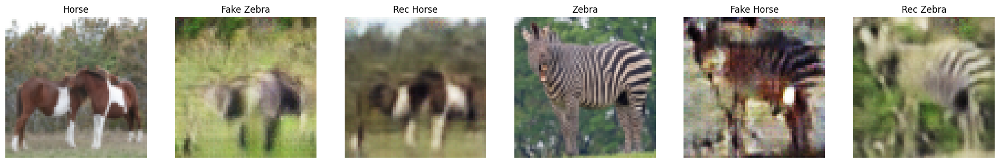

[Epoch 41/50 | Iter 0] G: 3.671  D: 0.321


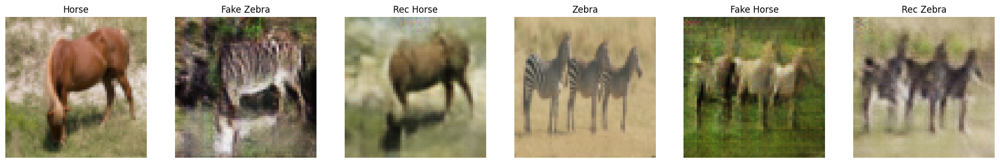

[Epoch 41/50 | Iter 500] G: 5.065  D: 0.316


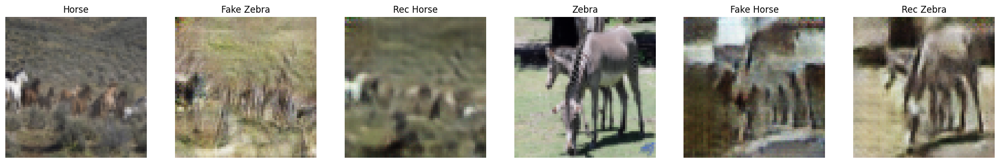

[Epoch 41/50 | Iter 1000] G: 5.327  D: 0.396


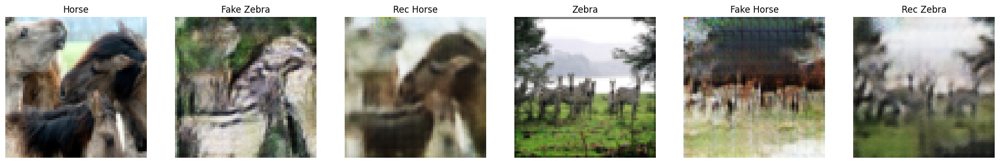

[Epoch 42/50 | Iter 0] G: 5.869  D: 0.207


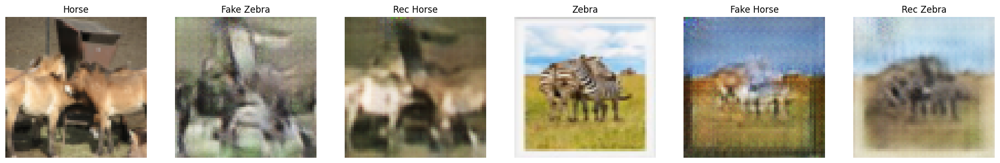

[Epoch 42/50 | Iter 500] G: 5.183  D: 0.148


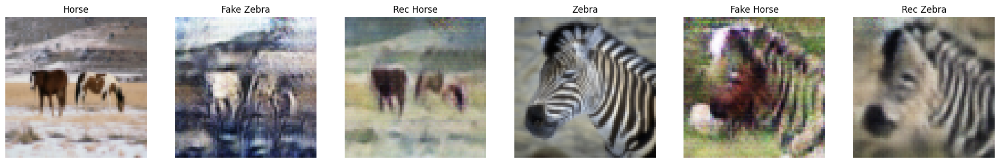

[Epoch 42/50 | Iter 1000] G: 6.445  D: 0.124


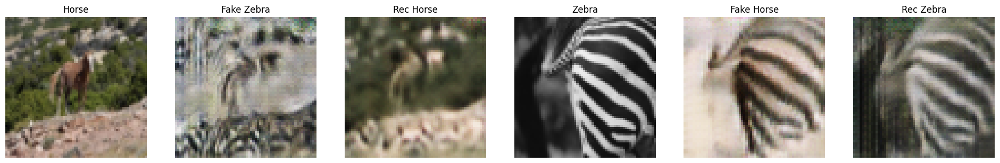

[Epoch 43/50 | Iter 0] G: 5.801  D: 0.356


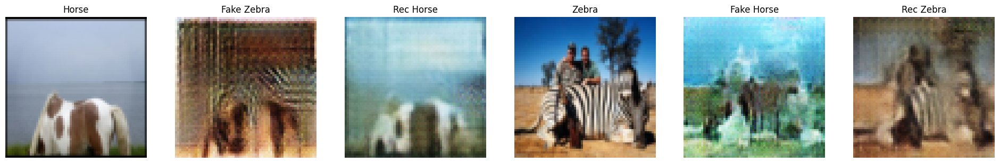

[Epoch 43/50 | Iter 500] G: 4.149  D: 0.189


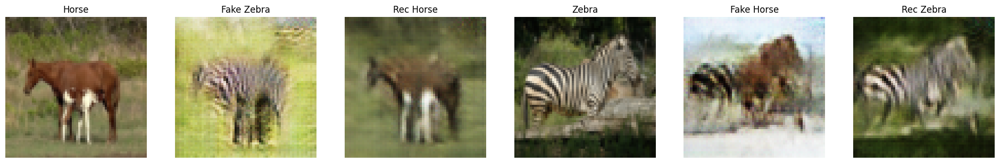

[Epoch 43/50 | Iter 1000] G: 4.062  D: 0.374


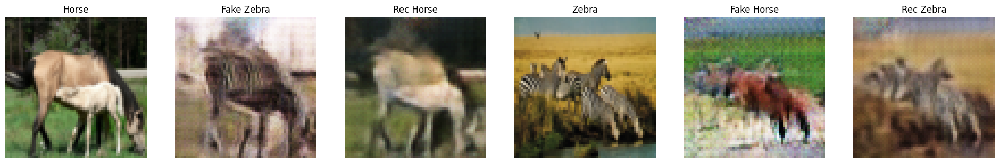

[Epoch 44/50 | Iter 0] G: 5.419  D: 0.102


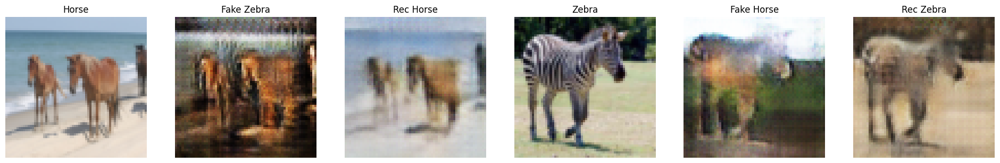

[Epoch 44/50 | Iter 500] G: 4.976  D: 0.139


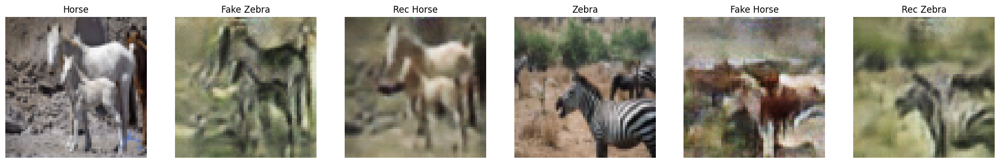

[Epoch 44/50 | Iter 1000] G: 7.322  D: 0.254


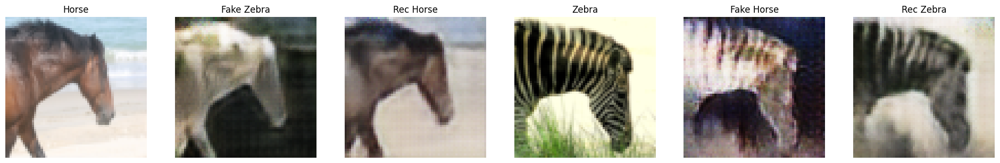

[Epoch 45/50 | Iter 0] G: 7.701  D: 0.108


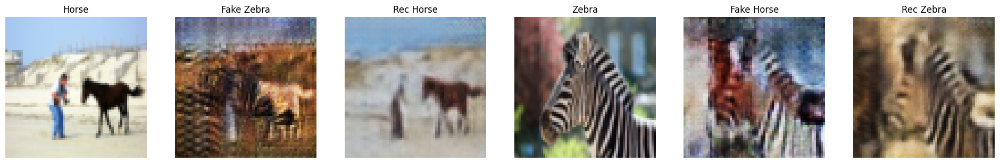

[Epoch 45/50 | Iter 500] G: 5.359  D: 0.343


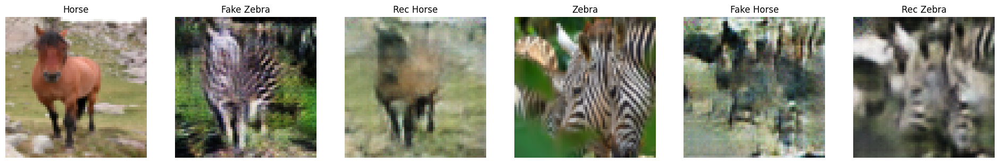

[Epoch 45/50 | Iter 1000] G: 5.859  D: 0.413


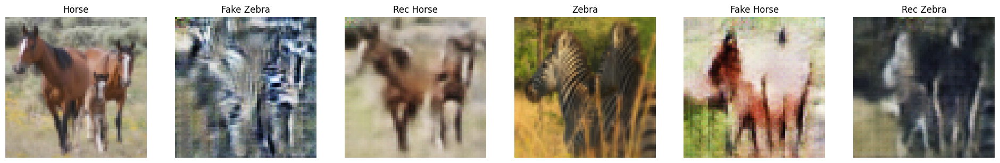

[Epoch 46/50 | Iter 0] G: 5.095  D: 0.466


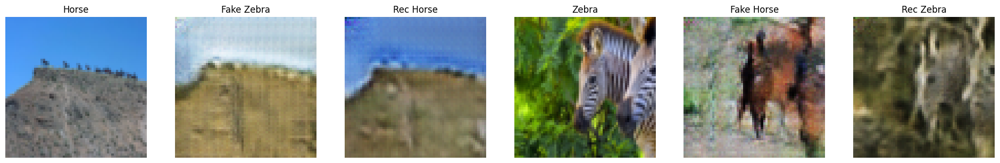

[Epoch 46/50 | Iter 500] G: 5.639  D: 0.208


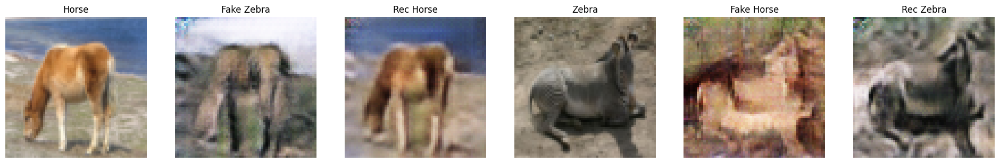

[Epoch 46/50 | Iter 1000] G: 6.714  D: 0.200


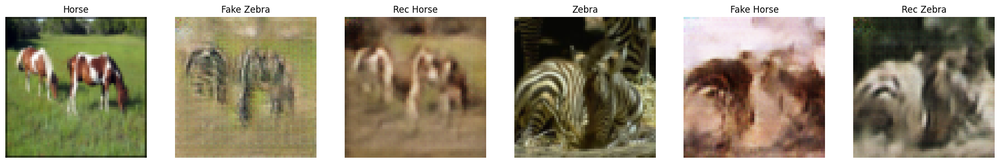

[Epoch 47/50 | Iter 0] G: 5.778  D: 0.133


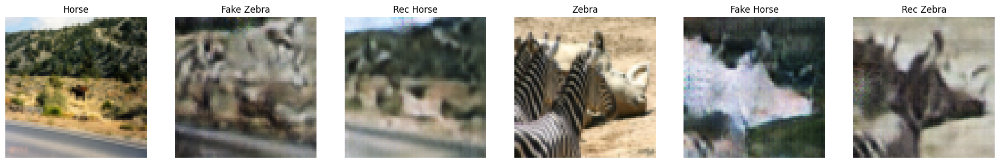

[Epoch 47/50 | Iter 500] G: 8.125  D: 0.145


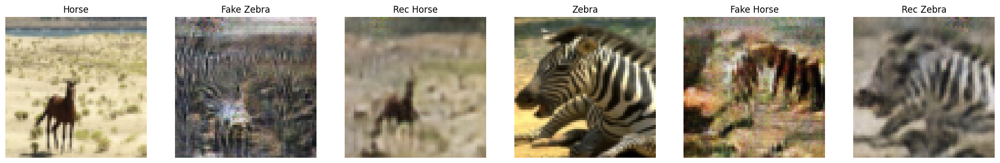

[Epoch 47/50 | Iter 1000] G: 5.835  D: 0.332


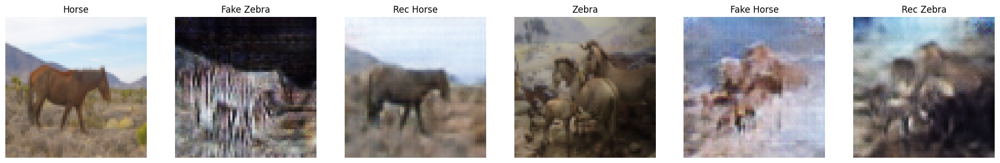

[Epoch 48/50 | Iter 0] G: 5.423  D: 0.244


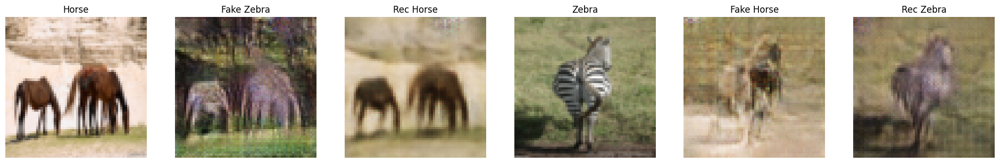

[Epoch 48/50 | Iter 500] G: 3.602  D: 0.341


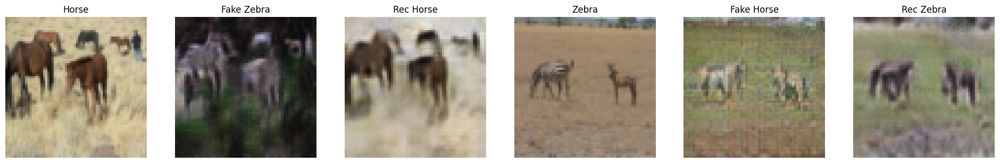

[Epoch 48/50 | Iter 1000] G: 5.788  D: 0.162


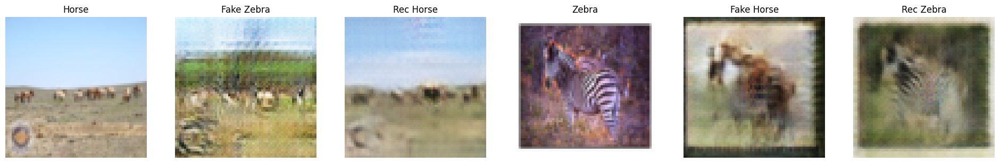

[Epoch 49/50 | Iter 0] G: 5.520  D: 0.105


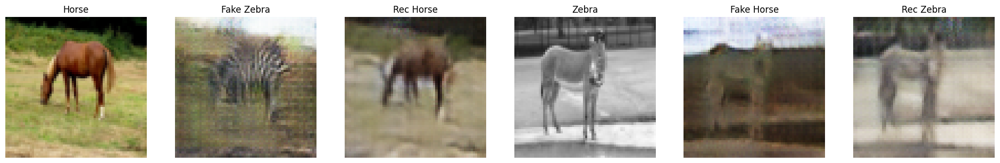

[Epoch 49/50 | Iter 500] G: 5.242  D: 0.467


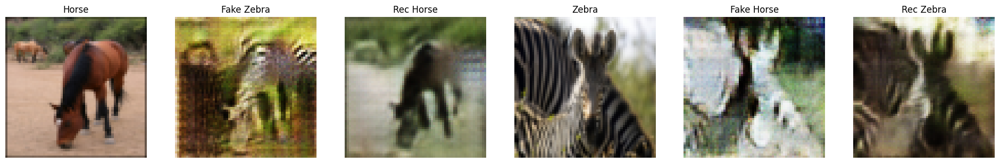

[Epoch 49/50 | Iter 1000] G: 5.930  D: 0.276


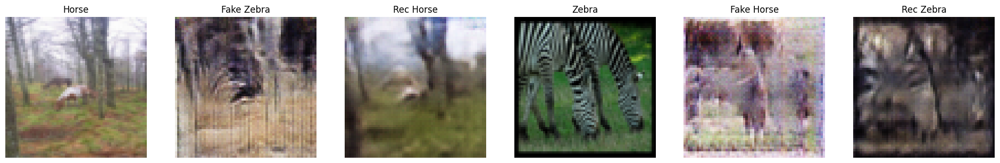

[Epoch 50/50 | Iter 0] G: 3.961  D: 0.223


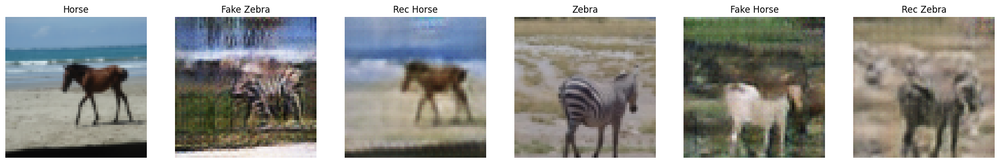

[Epoch 50/50 | Iter 500] G: 3.511  D: 0.504


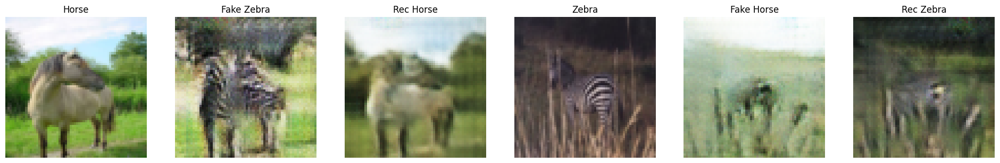

[Epoch 50/50 | Iter 1000] G: 5.828  D: 0.155


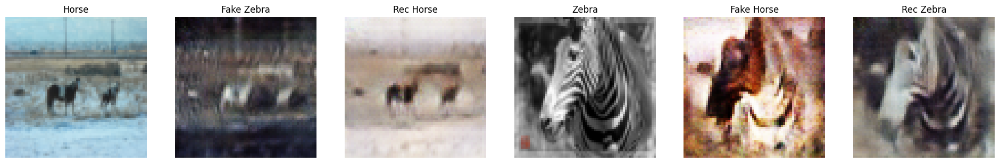

In [ ]:
num_epochs = 200 # im Paper 100 Epoch fixe Lernrate + 100 Epoche Anneling Scheduler  

for epoch in range(num_epochs):

    for i, (data_X,) in enumerate(loader_X):
        real_x = data_X.to(device)
        real_y = next(iter_Y).to(device)


        # Generatoren G_XY, G_YX updaten
        # 
        opt_G.zero_grad()

        fake_y = G_XY(real_x) # 
        rec_x = G_YX(fake_y) # Rekonstruktion für Cycle Loss (ungefähre Invertierbarkeit)

        fake_x = G_YX(real_y)
        rec_y = G_XY(fake_x)

        pred_fake_y = D_Y(fake_y)
        pred_fake_x = D_X(fake_x)

        # Adversarial Loss für Generator 

        loss_G_XY_adv = mse(pred_fake_y, torch.ones_like(pred_fake_y))
        loss_G_YX_adv = mse(pred_fake_x, torch.ones_like(pred_fake_x))

        # Cycle Loss

        loss_cyc_x = cycle_loss(rec_x, real_x) # ungefähre Invertierbarkeit 
        loss_cyc_y = cycle_loss(rec_y, real_y) 
        loss_cyc = (loss_cyc_x + loss_cyc_y) * lambda_cyc

        # Identity Loss 

        id_y = G_XY(real_y)
        id_x = G_YX(real_x)

        loss_id = (identity_loss(id_y, real_y) + identity_loss(id_x, real_x)) * lambda_id

        # Gesamt Generator Loss

        loss_G = loss_G_XY_adv + loss_G_YX_adv + loss_cyc + loss_id 

        loss_G.backward()
        opt_G.step()


        # Diskriminatoren 

        opt_D.zero_grad()

        pred_real_x = D_X(real_x)
        pred_fake_x = D_X(fake_x.detach())

        loss_D_X_real = mse(pred_real_x, torch.ones_like(pred_real_x))
        loss_D_X_fake = mse(pred_fake_x, torch.zeros_like(pred_real_x))

        # GAN-Loss für D_X

        loss_D_X = 0.5 * (loss_D_X_real + loss_D_X_fake)

        # D_Y 

        pred_real_y = D_Y(real_y)
        pred_fake_y = D_Y(fake_y.detach())

        
        loss_D_Y_real = mse(pred_real_y, torch.ones_like(pred_real_y))
        loss_D_Y_fake = mse(pred_fake_y, torch.zeros_like(pred_fake_y))

        loss_D_Y = 0.5 * (loss_D_Y_real + loss_D_Y_fake)

        loss_D = loss_D_X + loss_D_Y

        loss_D.backward()
        opt_D.step()
        if i % 500 == 0:
            print(f"[Epoch {epoch+1}/{num_epochs} | Iter {i}] "
                  f"G: {loss_G.item():.3f}  D: {loss_D.item():.3f}")
            
            with torch.no_grad():
                fake_y_vis = G_XY(real_x)
                rec_x_vis  = G_YX(fake_y_vis)
                fake_x_vis = G_YX(real_y)
                rec_y_vis  = G_XY(fake_x_vis)

            show_images(
                [real_x, fake_y_vis, rec_x_vis, real_y, fake_x_vis, rec_y_vis],
                ["Horse", "Fake Zebra", "Rec Horse",
                 "Zebra", "Fake Horse", "Rec Zebra"]
            )
